# Flood Damage Analysis - Hanumannagar Kankalini

Tile pre/post flood orthomosaics and prepare for vegetation loss analysis

In [11]:
import geoai
import os
import json
import glob
import shutil
import random
from pathlib import Path
from datetime import datetime
from collections import defaultdict
import numpy as np
import rasterio
from rasterio.windows import from_bounds
from rasterio.plot import show
import matplotlib.pyplot as plt

In [ ]:
# Paths
base_path = Path("/Users/jc/Desktop/AI Sense/Nepal/GEOAI/Hanumannagar Kankalini")
pre_flood_tif = base_path / "pre_flood/Hanumannagar_Preflood_Orthomosaic.tif"
post_flood_tif = base_path / "post_flood/Hanumannagar_Postflood_Orthomosaic.tif"

# Output directories
output_dir = Path("/Users/jc/Desktop/AI Sense/Nepal/GEOAI/tiles")
pre_tiles_dir = output_dir / "pre_flood"
post_tiles_dir = output_dir / "post_flood"

print(f"Pre-flood TIFF: {pre_flood_tif}")
print(f"Post-flood TIFF: {post_flood_tif}")

print("Tiling pre-flood orthomosaic...")
geoai.export_geotiff_tiles(
    in_raster=str(pre_flood_tif),
    out_folder=str(pre_tiles_dir),
    tile_size=1024,
    stride=896,
    skip_empty_tiles=True,
    quiet=False
)
print("Pre-flood tiling complete!")

Pre-flood TIFF: /Users/jc/Desktop/AI Sense/Nepal/GEOAI/Hanumannagar Kankalini/pre_flood/Hanumannagar_Preflood_Orthomosaic.tif
Post-flood TIFF: /Users/jc/Desktop/AI Sense/Nepal/GEOAI/Hanumannagar Kankalini/post_flood/Hanumannagar_Postflood_Orthomosaic.tif
Tiling pre-flood orthomosaic...

Raster info for /Users/jc/Desktop/AI Sense/Nepal/GEOAI/Hanumannagar Kankalini/pre_flood/Hanumannagar_Preflood_Orthomosaic.tif:
  CRS: EPSG:32645
  Dimensions: 60971 x 88127
  Resolution: (0.04312250000000027, 0.04312249999999988)
  Bands: 4
  Bounds: BoundingBox(left=489356.8124586606, bottom=2935640.4431431284, right=491986.03440616064, top=2939440.6997006284)


Generated: 780, With features: 0:  12%|█▏        | 780/6732 [00:16<01:49, 54.25it/s]

KeyboardInterrupt: 

Generated: 780, With features: 0:  12%|█▏        | 780/6732 [00:30<01:49, 54.25it/s]

In [ ]:
os.makedirs(post_tiles_dir / "images", exist_ok=True)
pre_tiles = glob.glob(str(pre_tiles_dir / "images/*.tif"))
no_overlap = []

with rasterio.open(post_flood_tif) as post_src:
    post_bounds = post_src.bounds
    print(f"Post-flood bounds: {post_bounds}")
    created = 0

    for i, pre_tile in enumerate(pre_tiles):
        with rasterio.open(pre_tile) as pre_src:
            tb = pre_src.bounds

        if tb.left < post_bounds.right and tb.right > post_bounds.left and tb.bottom < post_bounds.top and tb.top > post_bounds.bottom:
            window = from_bounds(tb.left, tb.bottom, tb.right, tb.top, post_src.transform)
            data = post_src.read(window=window)
            meta = post_src.meta.copy()
            meta.update({'height': data.shape[1], 'width': data.shape[2], 'transform': rasterio.windows.transform(window, post_src.transform)})

            with rasterio.open(post_tiles_dir / "images" / Path(pre_tile).name, 'w', **meta) as dst:
                dst.write(data)
            created += 1
        else:
            no_overlap.append(Path(pre_tile).name)

        if (i + 1) % 1000 == 0:
            print(f"Checked {i + 1}/{len(pre_tiles)} tiles...")

print(f"\nTotal: {len(pre_tiles)} | Matched: {created} | Outside: {len(no_overlap)} | Rate: {created/len(pre_tiles)*100:.1f}%")
if no_overlap[:5]:
    print(f"First non-overlapping: {no_overlap[:5]}")

In [ ]:
def analyze_tile(tile_path):
    with rasterio.open(str(tile_path)) as src:
        data = src.read()
        rgb = data[:3]
        bounds = src.bounds
        is_white = np.all(rgb == 255)
        uniq = len(np.unique(rgb))
        return {
            "file": {"name": tile_path.name, "size_mb": round(tile_path.stat().st_size/1024/1024, 2)},
            "geographic": {"bounds": {"left": round(bounds.left, 3), "bottom": round(bounds.bottom, 3), "right": round(bounds.right, 3), "top":
round(bounds.top, 3)}, "center": {"x": round((bounds.left+bounds.right)/2, 3), "y": round((bounds.bottom+bounds.top)/2, 3)}, "crs": str(src.crs), "width_m":
round(bounds.right-bounds.left, 2), "height_m": round(bounds.top-bounds.bottom, 2)},
            "pixel_stats": {"shape": list(data.shape), "rgb_unique": int(uniq), "rgb_mean": round(float(rgb.mean()), 2), "rgb_std": round(float(rgb.std()),
2), "rgb_min": int(rgb.min()), "rgb_max": int(rgb.max()), "alpha_mean": round(float(data[3].mean()), 2) if data.shape[0]==4 else 255.0},
            "quality": {"is_valid": int(uniq >= 10 and not is_white), "is_empty": int(is_white), "has_transparency": int(data[3].mean() < 255) if
data.shape[0]==4 else 0}
        }

base = Path("/Users/jc/Desktop/AI Sense/Nepal/GEOAI")
metadata = {"pre_flood": {}, "post_flood": {}}
print(f"Start: {datetime.now().strftime('%H:%M:%S')}")

for phase, folder in [("pre_flood", "tiles/pre_flood/images"), ("post_flood", "tiles/post_flood/images")]:
    tiles = sorted((base / folder).glob("*.tif"))
    for i, tile in enumerate(tiles):
        metadata[phase][tile.name] = analyze_tile(tile)
        if (i+1) % 500 == 0:
            print(f"{phase}: {i+1}/{len(tiles)} ({(i+1)/len(tiles)*100:.1f}%)")

with open(base / "tiles_metadata.json", 'w') as f:
    json.dump(metadata, f, indent=2)

print(f"Done: {datetime.now().strftime('%H:%M:%S')}")
print(f"Saved: {len(metadata['pre_flood'])} pre + {len(metadata['post_flood'])} post")

In [12]:
base = Path("/Users/jc/Desktop/AI Sense/Nepal/GEOAI")
with open(base / "tiles_metadata.json", 'r') as f:
    meta = json.load(f)

ranges = [(0,10), (10,50), (50,100), (100,150), (150,200), (200,256)]
pre_dist = defaultdict(int)
post_dist = defaultdict(int)

for data in meta['pre_flood'].values():
    uniq = data['pixel_stats']['rgb_unique']
    for rmin, rmax in ranges:
        if rmin <= uniq < rmax:
            pre_dist[f"{rmin}-{rmax}"] += 1
            break

for data in meta['post_flood'].values():
    uniq = data['pixel_stats']['rgb_unique']
    for rmin, rmax in ranges:
        if rmin <= uniq < rmax:
            post_dist[f"{rmin}-{rmax}"] += 1
            break

print("=== RGB UNIQUE VALUES DISTRIBUTION ===")
print(f"\nPRE-FLOOD (total: {len(meta['pre_flood'])}):")
for rmin, rmax in ranges:
    key = f"{rmin}-{rmax}"
    print(f"  {key:12s}: {pre_dist[key]:5d} ({pre_dist[key]/len(meta['pre_flood'])*100:5.1f}%)")

print(f"\nPOST-FLOOD (total: {len(meta['post_flood'])}):")
for rmin, rmax in ranges:
    key = f"{rmin}-{rmax}"
    print(f"  {key:12s}: {post_dist[key]:5d} ({post_dist[key]/len(meta['post_flood'])*100:5.1f}%)")

common = set(meta['pre_flood'].keys()) & set(meta['post_flood'].keys())
both_good = sum(1 for n in common if meta['pre_flood'][n]['quality']['is_valid'] and meta['post_flood'][n]['quality']['is_valid'])
pre_good_post_bad = sum(1 for n in common if meta['pre_flood'][n]['quality']['is_valid'] and not meta['post_flood'][n]['quality']['is_valid'])
pre_bad_post_good = sum(1 for n in common if not meta['pre_flood'][n]['quality']['is_valid'] and meta['post_flood'][n]['quality']['is_valid'])
both_bad = sum(1 for n in common if not meta['pre_flood'][n]['quality']['is_valid'] and not meta['post_flood'][n]['quality']['is_valid'])

print(f"\n=== PAIR ANALYSIS (total pairs: {len(common)}) ===")
print(f"Both good (valid):      {both_good:5d} ({both_good/len(common)*100:5.1f}%)")
print(f"Pre good, Post bad:     {pre_good_post_bad:5d} ({pre_good_post_bad/len(common)*100:5.1f}%)")
print(f"Pre bad, Post good:     {pre_bad_post_good:5d} ({pre_bad_post_good/len(common)*100:5.1f}%)")
print(f"Both bad (empty):       {both_bad:5d} ({both_bad/len(common)*100:5.1f}%)")

pre_valid = sum(1 for t in meta['pre_flood'].values() if t['quality']['is_valid'])
post_valid = sum(1 for t in meta['post_flood'].values() if t['quality']['is_valid'])
print(f"\n=== QUALITY SUMMARY ===")
print(f"Pre:  {pre_valid:5d} valid ({pre_valid/len(meta['pre_flood'])*100:5.1f}%)")
print(f"Post: {post_valid:5d} valid ({post_valid/len(meta['post_flood'])*100:5.1f}%)")

good_pairs = [n for n in common if meta['pre_flood'][n]['quality']['is_valid'] and meta['post_flood'][n]['quality']['is_valid']]
high_quality_pairs = [n for n in good_pairs if meta['pre_flood'][n]['pixel_stats']['rgb_unique'] > 100 and
meta['post_flood'][n]['pixel_stats']['rgb_unique'] > 100]
pre_avg = sum(meta['pre_flood'][n]['pixel_stats']['rgb_unique'] for n in high_quality_pairs) / len(high_quality_pairs) if high_quality_pairs else 0
post_avg = sum(meta['post_flood'][n]['pixel_stats']['rgb_unique'] for n in high_quality_pairs) / len(high_quality_pairs) if high_quality_pairs else 0

print(f"\n=== HIGH QUALITY PAIRS (>100 RGB unique) ===")
print(f"High quality pairs: {len(high_quality_pairs)} ({len(high_quality_pairs)/len(common)*100:.1f}%)")
print(f"Pre-flood avg:  {pre_avg:.1f} | Post-flood avg: {post_avg:.1f}")

dst_pre = base / "clean_tiles/pre_flood"
dst_post = base / "clean_tiles/post_flood"
dst_pre.mkdir(parents=True, exist_ok=True)
dst_post.mkdir(parents=True, exist_ok=True)

print(f"\nCopying {len(good_pairs)} good pairs...")
src_pre = base / "tiles/pre_flood/images"
src_post = base / "tiles/post_flood/images"
for i, tile_name in enumerate(good_pairs):
    shutil.copy2(src_pre / tile_name, dst_pre / tile_name)
    shutil.copy2(src_post / tile_name, dst_post / tile_name)
    if (i + 1) % 500 == 0:
        print(f"Copied {i + 1}/{len(good_pairs)}")

print(f"Done! {len(good_pairs)} tile pairs in clean_tiles/")

=== RGB UNIQUE VALUES DISTRIBUTION ===

PRE-FLOOD (total: 578):
  0-10        :   480 ( 83.0%)
  10-50       :     0 (  0.0%)
  50-100      :     1 (  0.2%)
  100-150     :     2 (  0.3%)
  150-200     :     6 (  1.0%)
  200-256     :    57 (  9.9%)

POST-FLOOD (total: 502):
  0-10        :   392 ( 78.1%)
  10-50       :     0 (  0.0%)
  50-100      :     0 (  0.0%)
  100-150     :     2 (  0.4%)
  150-200     :    23 (  4.6%)
  200-256     :    85 ( 16.9%)

=== PAIR ANALYSIS (total pairs: 502) ===
Both good (valid):         82 ( 16.3%)
Pre good, Post bad:        12 (  2.4%)
Pre bad, Post good:        28 (  5.6%)
Both bad (empty):         380 ( 75.7%)

=== QUALITY SUMMARY ===
Pre:     98 valid ( 17.0%)
Post:   110 valid ( 21.9%)

=== HIGH QUALITY PAIRS (>100 RGB unique) ===
High quality pairs: 82 (16.3%)
Pre-flood avg:  243.0 | Post-flood avg: 217.6

Copying 82 good pairs...
Done! 82 tile pairs in clean_tiles/


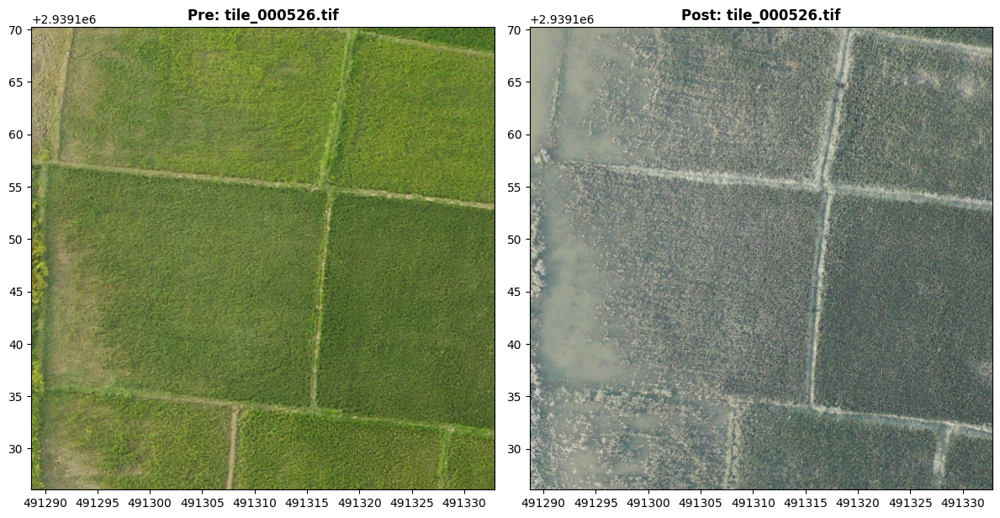

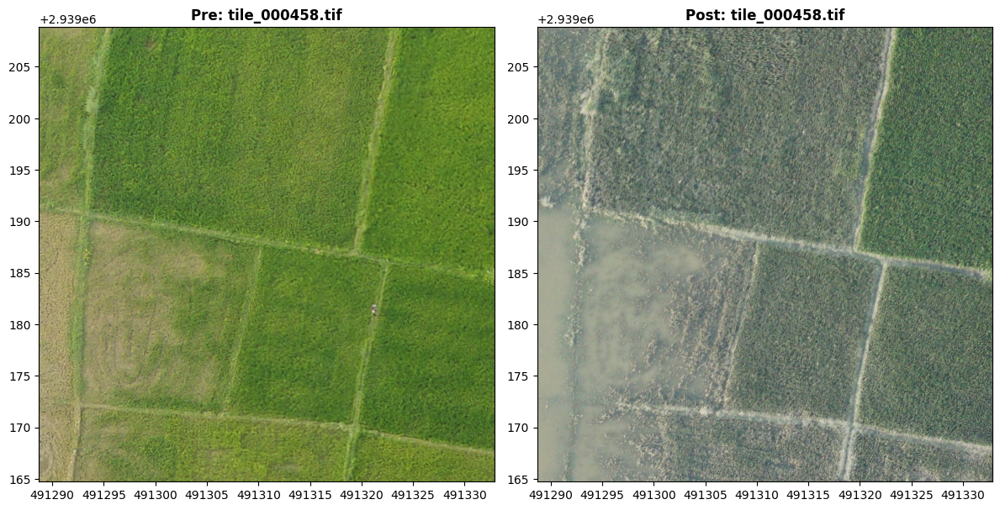

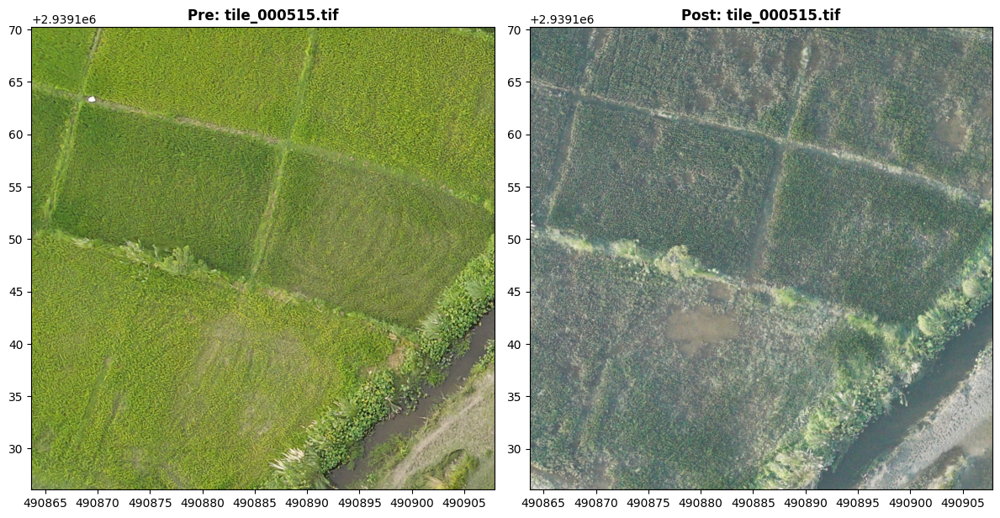

Generated: 578, With features: 0:   9%|▊         | 578/6732 [14:02<2:29:26,  1.46s/it]


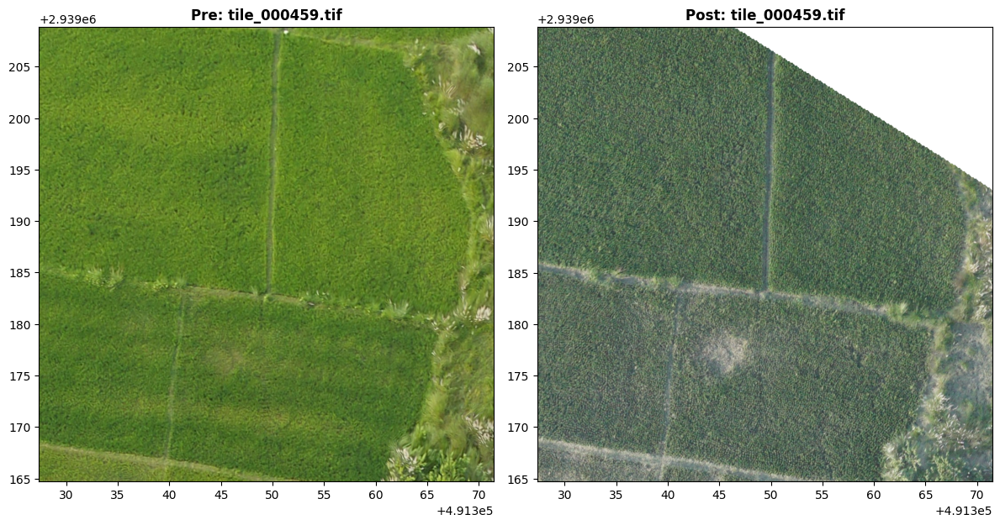

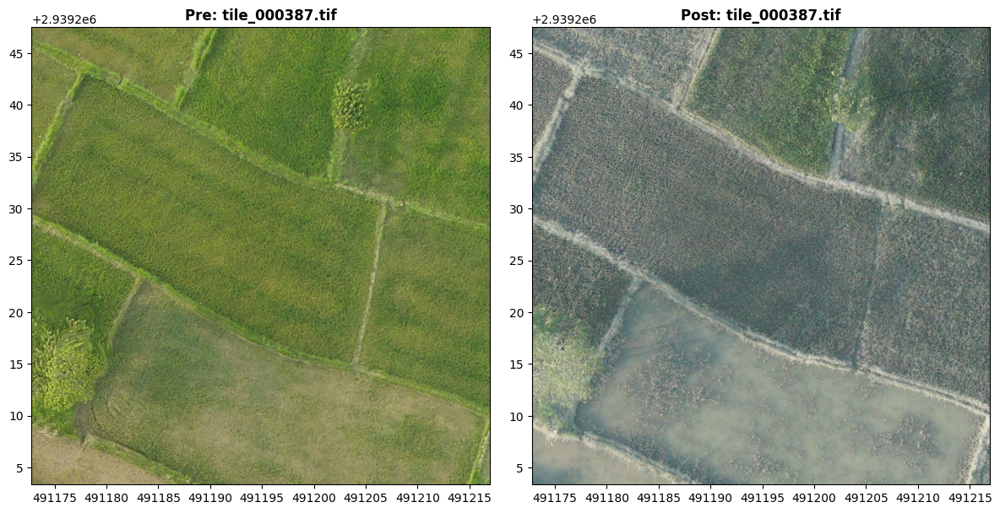

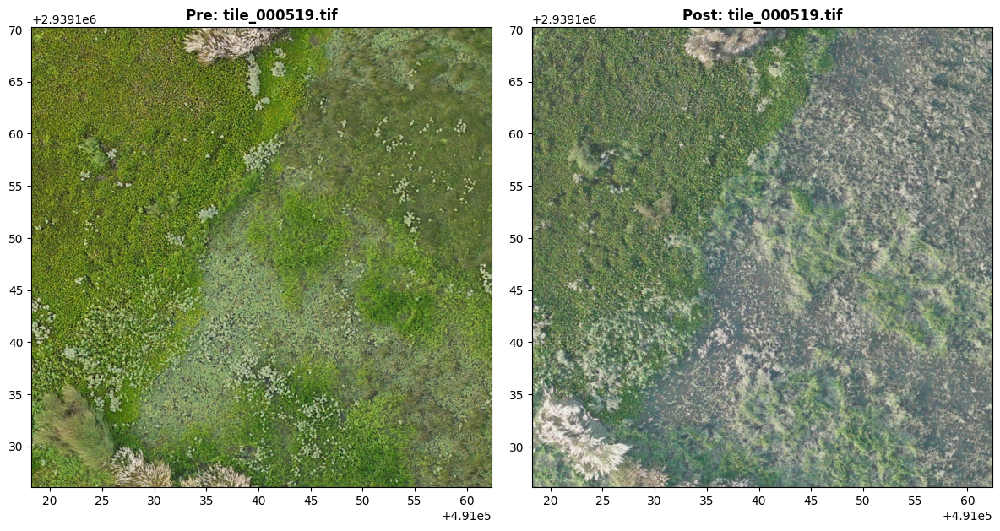

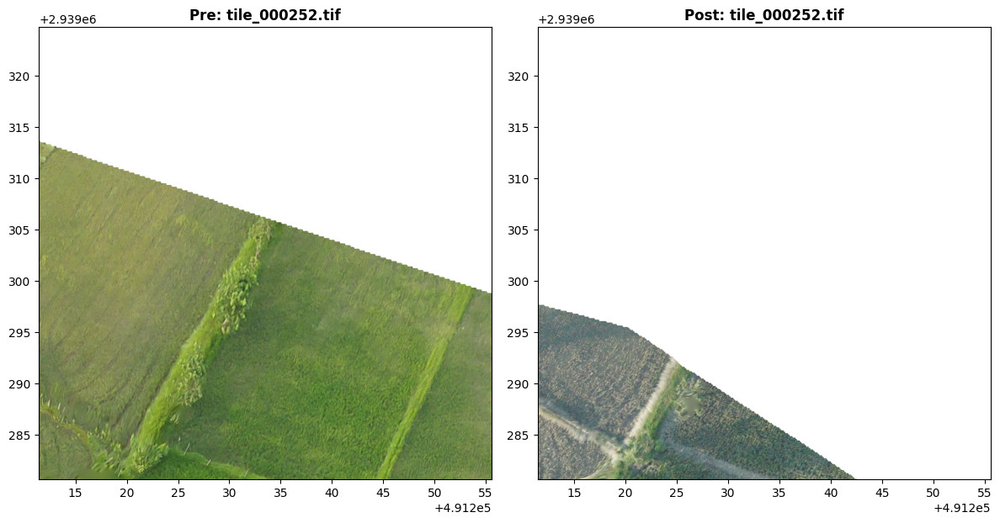

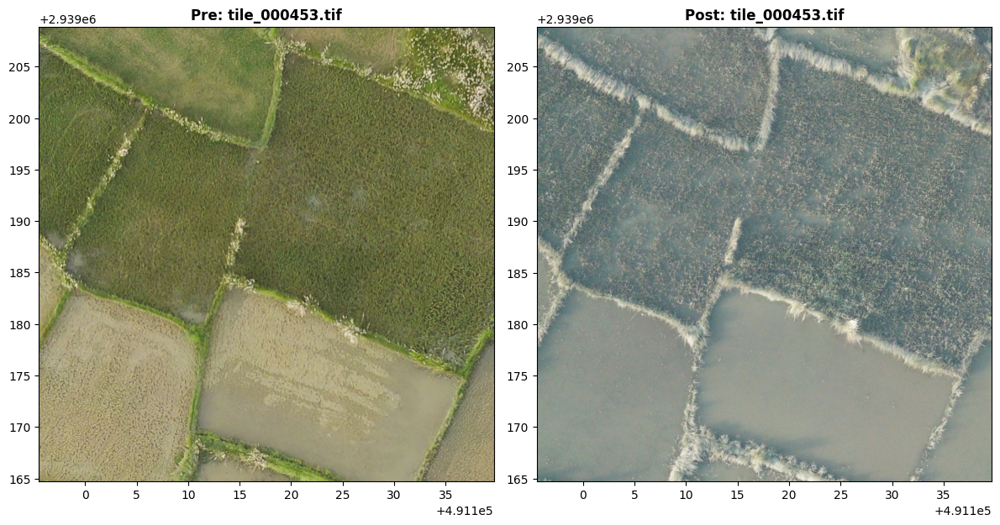

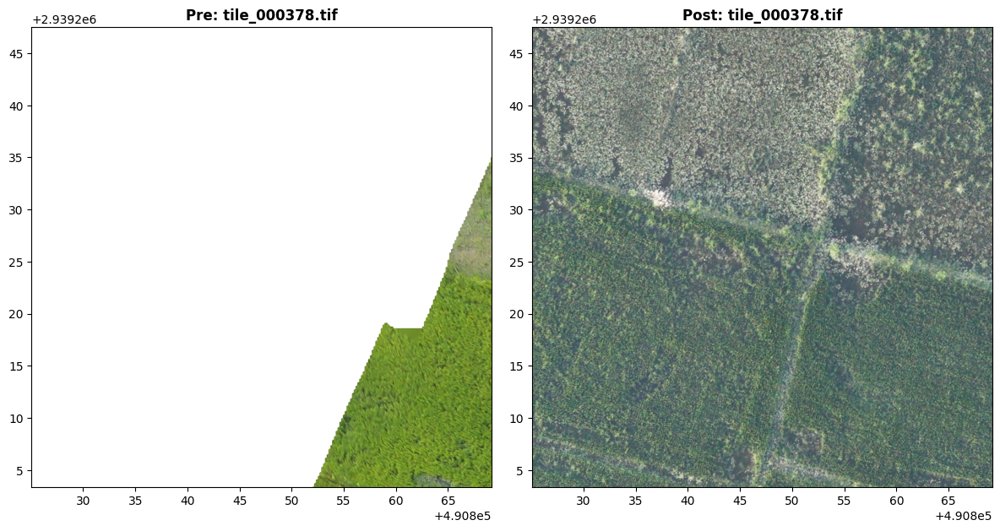

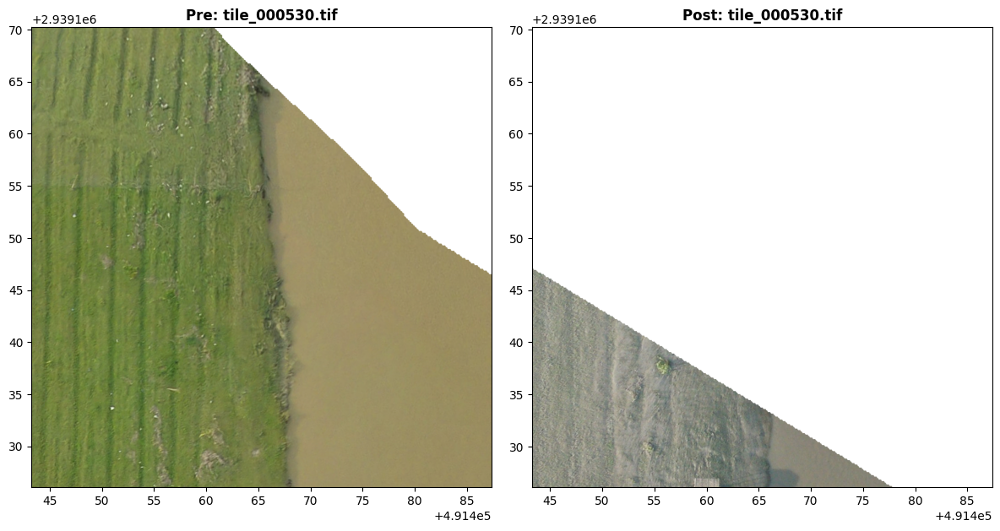

In [13]:
samples = random.sample(good_pairs, 10)
for tile_name in samples:
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    with rasterio.open(base / f"clean_tiles/pre_flood/{tile_name}") as src:
        show(src, ax=axes[0], title=f"Pre: {tile_name}")
    with rasterio.open(base / f"clean_tiles/post_flood/{tile_name}") as src:
        show(src, ax=axes[1], title=f"Post: {tile_name}")
    plt.tight_layout()
    plt.show()